<h2 align=center>Exploratory Data Analysis With Python and Pandas</h2>


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calmap
from ydata_profiling import ProfileReport

c:\Users\Administrator\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Link to data source: https://www.kaggle.com/aungpyaeap/supermarket-sales



### Initial Data Exploration

In [4]:
df = pd.read_csv("C:/Users/Administrator/Downloads/supermarket_sales - Sheet1.csv")


In [6]:
df.head(10)

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3
5,699-14-3026,C,Naypyitaw,Normal,Male,Electronic accessories,85.39,7,29.8865,627.6165,3/25/2019,18:30,Ewallet,597.73,4.761905,29.8865,4.1
6,355-53-5943,A,Yangon,Member,Female,Electronic accessories,68.84,6,20.6520,433.6920,2/25/2019,14:36,Ewallet,413.04,4.761905,20.6520,5.8
7,315-22-5665,C,Naypyitaw,Normal,Female,Home and lifestyle,73.56,10,36.7800,772.3800,2/24/2019,11:38,Ewallet,735.60,4.761905,36.7800,8.0
8,665-32-9167,A,Yangon,Member,Female,Health and beauty,36.26,2,3.6260,76.1460,1/10/2019,17:15,Credit card,72.52,4.761905,3.6260,7.2
9,692-92-5582,B,Mandalay,Member,Female,Food and beverages,54.84,3,8.2260,172.7460,2/20/2019,13:27,Credit card,164.52,4.761905,8.2260,5.9


In [7]:
df.columns


Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Date',
       'Time', 'Payment', 'cogs', 'gross margin percentage', 'gross income',
       'Rating'],
      dtype='object')

In [8]:
df.dtypes

Invoice ID                  object
Branch                      object
City                        object
Customer type               object
Gender                      object
Product line                object
Unit price                 float64
Quantity                     int64
Tax 5%                     float64
Total                      float64
Date                        object
Time                        object
Payment                     object
cogs                       float64
gross margin percentage    float64
gross income               float64
Rating                     float64
dtype: object

In [10]:
df['Date'] = pd.to_datetime(df['Date'])

In [12]:
df.set_index('Date' ,inplace=True)

In [13]:
df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,,
2019-01-05,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,13:08,Ewallet,522.83,4.761905,26.1415,9.1
2019-03-08,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,10:29,Cash,76.40,4.761905,3.8200,9.6
2019-03-03,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,13:23,Credit card,324.31,4.761905,16.2155,7.4
2019-01-27,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,20:33,Ewallet,465.76,4.761905,23.2880,8.4
2019-02-08,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [14]:
df.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369,6.97270
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825,1.71858
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500,4.00000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875,5.50000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000,7.00000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250,8.50000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000,10.00000


###  Univariate Analysis

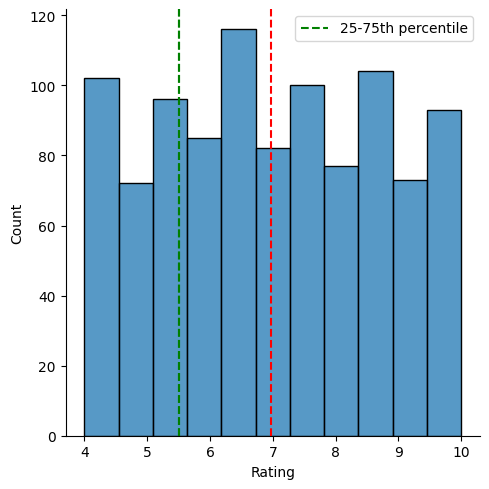

In [17]:
sns.displot(df['Rating'])
plt.axvline(x=np.mean(df['Rating']),c='red' ,ls='--')
plt.axvline(x=np.percentile(df['Rating'],25),c='green',ls='--',label='25-75th percentile')
plt.axvline(x=np.percentile(df['Rating'],25),c='green',ls='--')
plt.legend()

array([[<Axes: title={'center': 'Unit price'}>,
        <Axes: title={'center': 'Quantity'}>,
        <Axes: title={'center': 'Tax 5%'}>],
       [<Axes: title={'center': 'Total'}>,
        <Axes: title={'center': 'cogs'}>,
        <Axes: title={'center': 'gross margin percentage'}>],
       [<Axes: title={'center': 'gross income'}>,
        <Axes: title={'center': 'Rating'}>, <Axes: >]], dtype=object)

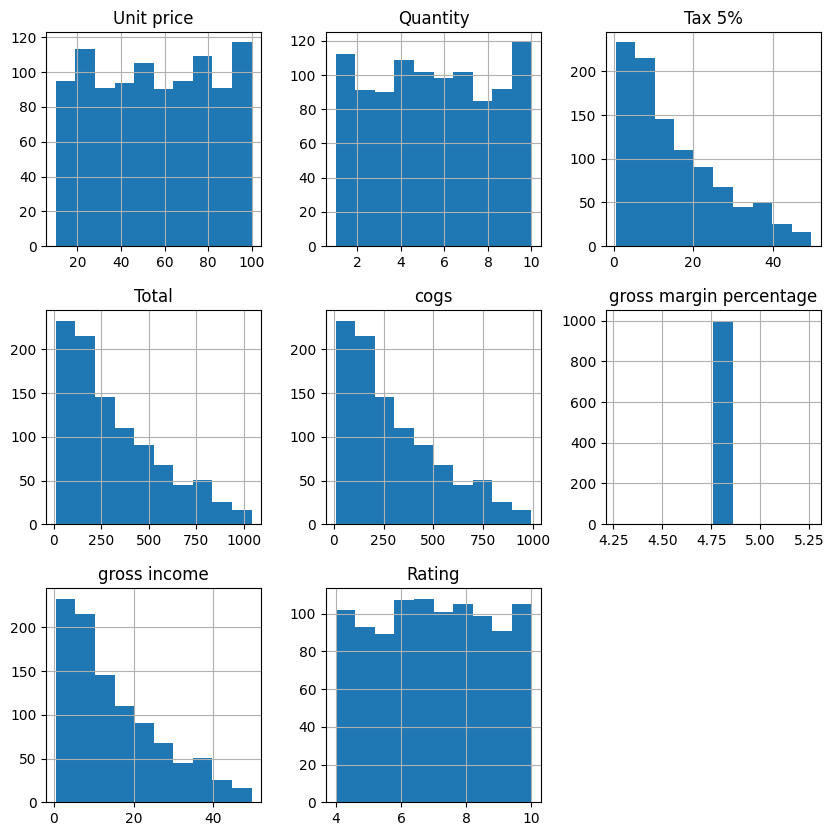

In [20]:
df.hist(figsize=(10,10))

<Axes: xlabel='count', ylabel='Branch'>

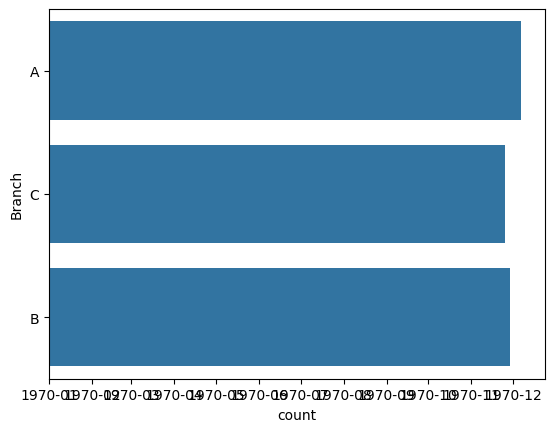

In [21]:
sns.countplot(df['Branch'])

In [22]:
df['Branch'].value_counts()

Branch
A    340
B    332
C    328
Name: count, dtype: int64

<Axes: xlabel='count', ylabel='Payment'>

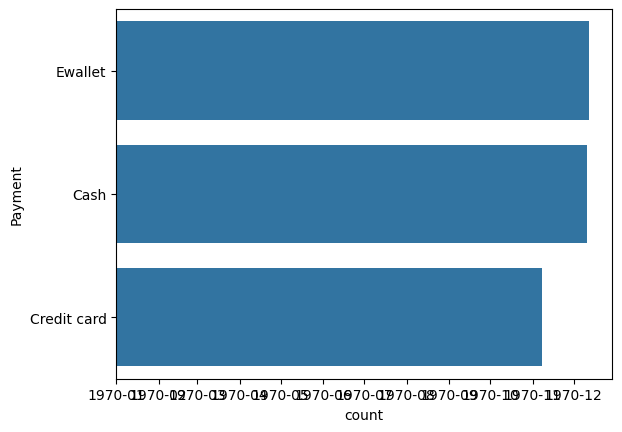

In [23]:
sns.countplot(df['Payment'])

### Bivariate Analysis

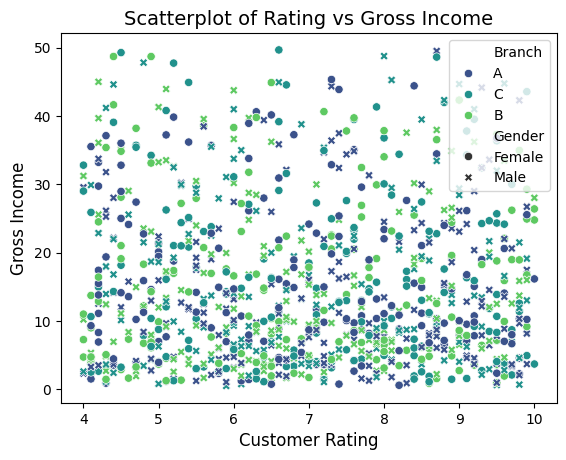

In [27]:
sns.scatterplot(
    x=df['Rating'], 
    y=df['gross income'], 
    hue=df['Branch'],    # Add color coding based on 'Branch' column (if available)
    style=df['Gender'],  # Different markers for 'Gender' column (if available)
    palette="viridis",   # Use a visually appealing color palette
)

# Add labels and title
plt.title("Scatterplot of Rating vs Gross Income", fontsize=14)
plt.xlabel("Customer Rating", fontsize=12)
plt.ylabel("Gross Income", fontsize=12)

# Show the plot
plt.show()

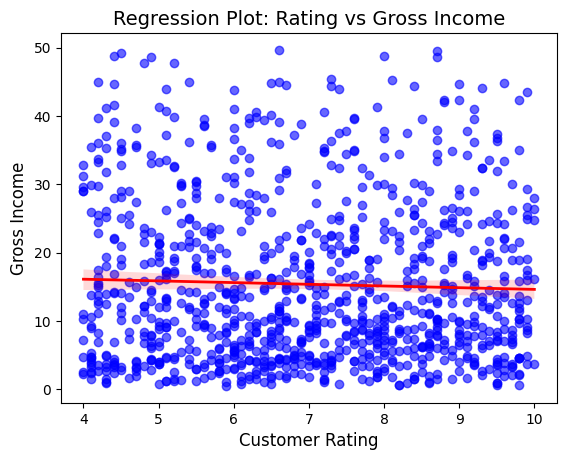

In [28]:
sns.regplot(
    x=df['Rating'],      # X-axis data
    y=df['gross income'], # Y-axis data
    scatter_kws={'color': 'blue', 'alpha': 0.6}, # Scatter point style
    line_kws={'color': 'red', 'linewidth': 2},  # Regression line style
    ci=95  # Confidence interval (default is 95%)
)

# Add labels and title
plt.title("Regression Plot: Rating vs Gross Income", fontsize=14)
plt.xlabel("Customer Rating", fontsize=12)
plt.ylabel("Gross Income", fontsize=12)

# Show the plot
plt.show()


<Axes: xlabel='Branch', ylabel='gross income'>

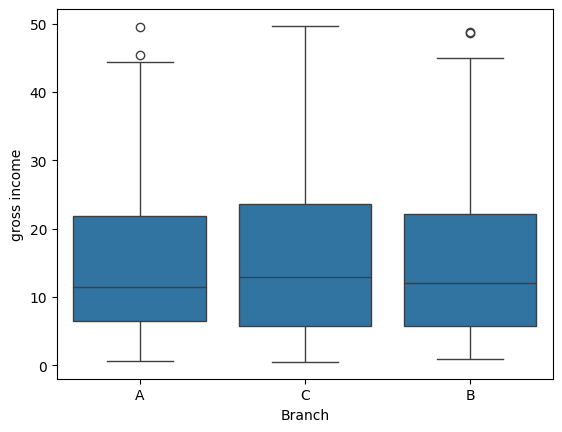

In [29]:
sns.boxplot(x=df['Branch'],y=df['gross income'])

<Axes: xlabel='Gender', ylabel='gross income'>

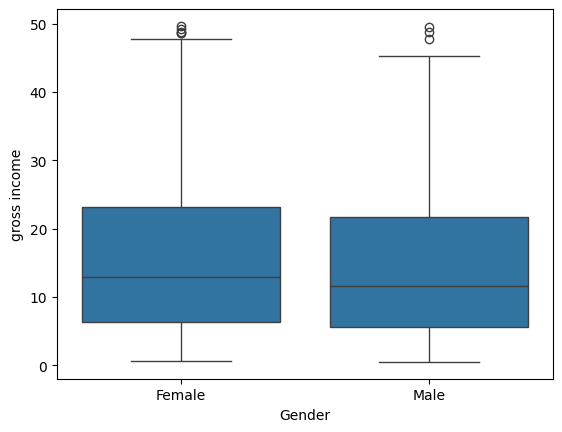

In [30]:
sns.boxplot(x=df['Gender'],y=df['gross income'])

In [38]:
df['gross income'] = pd.to_numeric(df['gross income'], errors='coerce')


In [40]:
df.groupby(df.index).mean('gross income')

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,
2019-01-01,54.995833,6.750000,18.830083,395.431750,376.601667,4.761905,18.830083,6.583333
2019-01-02,44.635000,6.000000,11.580375,243.187875,231.607500,4.761905,11.580375,6.050000
2019-01-03,59.457500,4.625000,12.369813,259.766062,247.396250,4.761905,12.369813,8.112500
2019-01-04,51.743333,5.333333,12.886417,270.614750,257.728333,4.761905,12.886417,6.516667
2019-01-05,61.636667,4.583333,14.034458,294.723625,280.689167,4.761905,14.034458,7.433333
...,...,...,...,...,...,...,...,...
2019-03-26,42.972308,4.000000,7.188692,150.962538,143.773846,4.761905,7.188692,6.623077
2019-03-27,56.841000,4.500000,13.822950,290.281950,276.459000,4.761905,13.822950,6.760000
2019-03-28,45.525000,4.800000,10.616200,222.940200,212.324000,4.761905,10.616200,7.050000


<Axes: xlabel='Date', ylabel='gross income'>

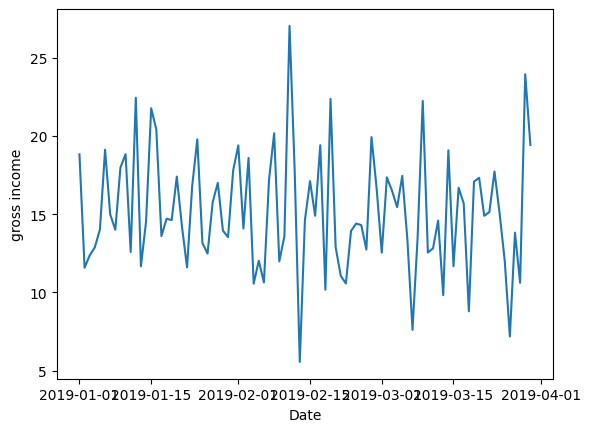

In [42]:
sns.lineplot(x=df.groupby(df.index).mean('gross income').index,
             y=df.groupby(df.index).mean('gross income')['gross income'])

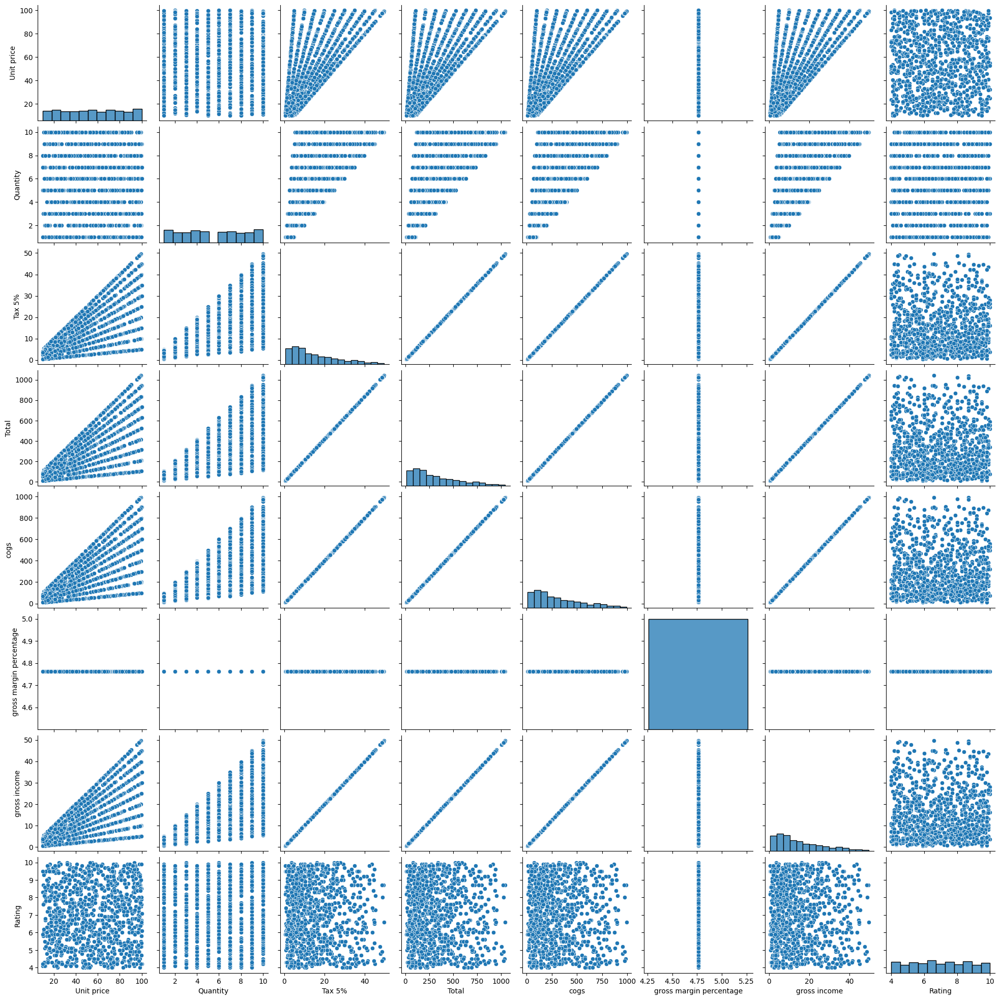

In [44]:
sns.pairplot(df)

### Dealing With Duplicate Rows and Missing Values

In [47]:
df.duplicated().sum()

np.int64(0)

In [48]:
df[df.duplicated()==True]

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,,


In [52]:
df.isna().sum()/len(df)

Invoice ID                 0.0
Branch                     0.0
City                       0.0
Customer type              0.0
Gender                     0.0
Product line               0.0
Unit price                 0.0
Quantity                   0.0
Tax 5%                     0.0
Total                      0.0
Time                       0.0
Payment                    0.0
cogs                       0.0
gross margin percentage    0.0
gross income               0.0
Rating                     0.0
dtype: float64

<Axes: ylabel='Date'>

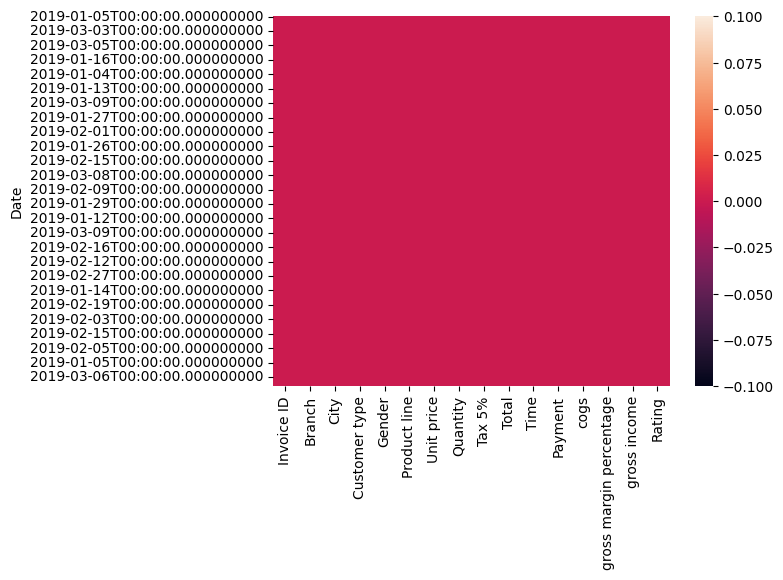

In [53]:
sns.heatmap(df.isnull())

In [59]:
df.fillna

<bound method NDFrame.fillna of              Invoice ID Branch       City Customer type  Gender  \
Date                                                              
2019-01-05  750-67-8428      A     Yangon        Member  Female   
2019-03-08  226-31-3081      C  Naypyitaw        Normal  Female   
2019-03-03  631-41-3108      A     Yangon        Normal    Male   
2019-01-27  123-19-1176      A     Yangon        Member    Male   
2019-02-08  373-73-7910      A     Yangon        Normal    Male   
...                 ...    ...        ...           ...     ...   
2019-01-29  233-67-5758      C  Naypyitaw        Normal    Male   
2019-03-02  303-96-2227      B   Mandalay        Normal  Female   
2019-02-09  727-02-1313      A     Yangon        Member    Male   
2019-02-22  347-56-2442      A     Yangon        Normal    Male   
2019-02-18  849-09-3807      A     Yangon        Member  Female   

                      Product line  Unit price  Quantity   Tax 5%      Total  \
Date            

In [61]:
df.mode().iloc(0)

In [64]:
!pip install ipywidgets

   ---------------------------------------- 0.0/2.3 MB ? eta -:--:--
   ---- ----------------------------------- 0.3/2.3 MB ? eta -:--:--
   -------- ------------------------------- 0.5/2.3 MB 2.1 MB/s eta 0:00:01
   ----------------- ---------------------- 1.0/2.3 MB 1.9 MB/s eta 0:00:01
   -------------------------- ------------- 1.6/2.3 MB 2.0 MB/s eta 0:00:01
   ------------------------------- -------- 1.8/2.3 MB 1.8 MB/s eta 0:00:01
   ----------------------------------- ---- 2.1/2.3 MB 1.8 MB/s eta 0:00:01
   ---------------------------------------- 2.3/2.3 MB 1.8 MB/s eta 0:00:00


In [65]:
dataset = pd.read_csv("C:/Users/Administrator/Downloads/supermarket_sales - Sheet1.csv")
prof = ProfileReport(dataset)
prof

Render HTML: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


### Correlation Analysis

In [67]:
round(np.corrcoef(df['gross income'],df['Rating'])[1][0],2)

np.float64(-0.04)

In [69]:
df = df.apply(pd.to_numeric, errors='coerce')


In [71]:
df = df.fillna(0)  # Or use df.fillna(df.mean()) for mean imputation


In [73]:
df = df.dropna()



In [74]:
correlation_matrix = df.corr()
print(correlation_matrix)


                         Invoice ID  Branch  City  Customer type  Gender  \
Invoice ID                      NaN     NaN   NaN            NaN     NaN   
Branch                          NaN     NaN   NaN            NaN     NaN   
City                            NaN     NaN   NaN            NaN     NaN   
Customer type                   NaN     NaN   NaN            NaN     NaN   
Gender                          NaN     NaN   NaN            NaN     NaN   
Product line                    NaN     NaN   NaN            NaN     NaN   
Unit price                      NaN     NaN   NaN            NaN     NaN   
Quantity                        NaN     NaN   NaN            NaN     NaN   
Tax 5%                          NaN     NaN   NaN            NaN     NaN   
Total                           NaN     NaN   NaN            NaN     NaN   
Time                            NaN     NaN   NaN            NaN     NaN   
Payment                         NaN     NaN   NaN            NaN     NaN   
cogs        

In [77]:
np.round(df.corr(),2)

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Invoice ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Branch,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product line,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Unit price,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.01,0.63,0.63,NaN,NaN,0.63,NaN,0.63,-0.01
Quantity,NaN,NaN,NaN,NaN,NaN,NaN,0.01,1.00,0.71,0.71,NaN,NaN,0.71,NaN,0.71,-0.02
Tax 5%,NaN,NaN,NaN,NaN,NaN,NaN,0.63,0.71,1.00,1.00,NaN,NaN,1.00,NaN,1.00,-0.04
Total,NaN,NaN,NaN,NaN,NaN,NaN,0.63,0.71,1.00,1.00,NaN,NaN,1.00,NaN,1.00,-0.04


<Axes: >

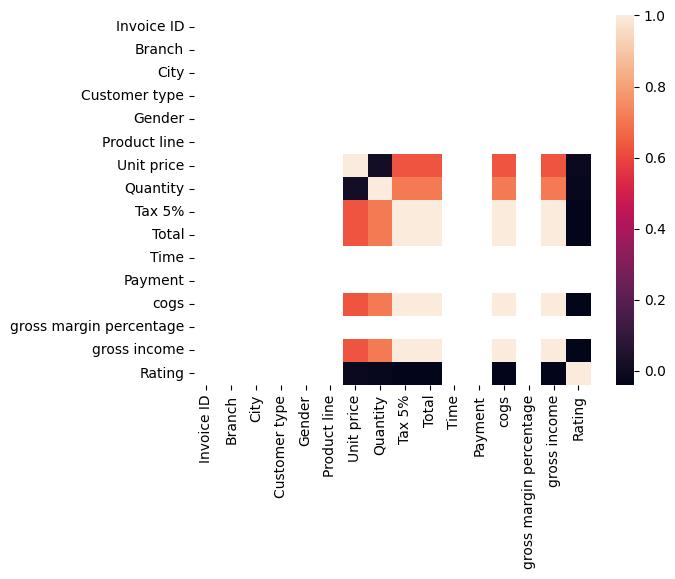

In [83]:
sns.heatmap(np.round(df.corr(),2))